In [56]:
import scipy 
import scipy.io as sio 
import numpy as np 
import matplotlib.pyplot as plt 
from scipy import stats 
import nibabel as nib
from surfplot import plot_metric

In [98]:
# Function to load matlab dicts, analysis output from catch-22 toolbox
# returns dictionary of arrays with keys named according to c22 metrics
def load_catch22(path):
    mdict = sio.loadmat(path)
    outdict = {}
    for row in mdict['results']: 
        k = row[0][0]
        data = np.squeeze(np.concatenate(row[1:]))
        outdict[k] = data 

    return outdict 

c22_cortex = load_catch22('hackaton2020Benelux/catch22/cortical/cortical_catch22.mat')
c22_subcortex = load_catch22('hackaton2020Benelux/catch22/subcortical/subcortical_catch22.mat')
keys = list(c22_cortex.keys())[1:]

In [92]:
# Load the L cortex standard brain and L hemi parcellation labels (HCP)
labs = nib.load('cortex_ColeAnticevic_NetPartition_GlasserParcels_L.label.gii').darrays[0].data
points,tris = nib.load('S1200.L.midthickness_MSMAll.32k_fs_LR.surf.gii').darrays
points = points.data; tris = tris.data; 

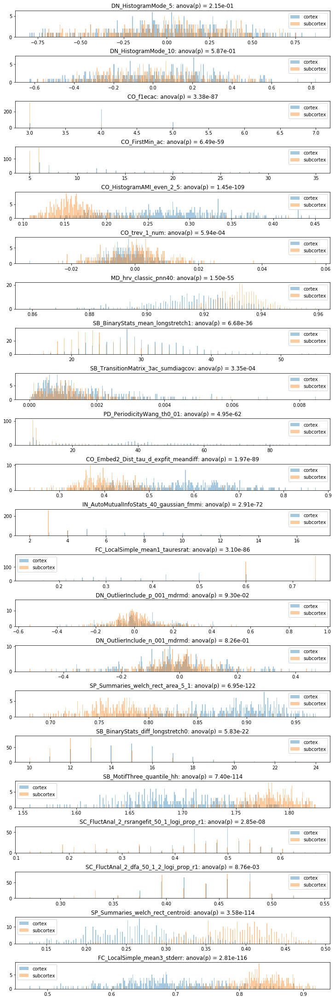

In [99]:
# For each metric in the C22 dataset, plot histogram of values from each parcellated area
# colour code according to cortex/subcortex
# Perform ANOVA test between the two groups, display p-val in title
fig, axes = plt.subplots(len(keys), 1, constrained_layout=True)
fig.set_size_inches(10,30)
for key,ax in zip(keys, axes.flat):
    cd = c22_cortex[key]
    sd = c22_subcortex[key]
    anova = stats.f_oneway(cd,sd)
    ax.hist(cd, cd.size, alpha=0.4)
    ax.hist(sd, sd.size, alpha=0.4)
    ax.legend(['cortex', 'subcortex'])
    ax.set_title('%s: anova(p) = %1.2e' % (key, anova.pvalue))

In [100]:
# Plot metric values in their respective areas on the brain surface
# change the key value to switch between metrics
k = keys[21]
cdata = np.zeros(points.shape[0])
for i in range(labs.min(), labs.max() + 1):
    cdata[labs == i] = c22_cortex[k][i]

f = plot_metric(points, tris, cdata)
f.update_layout(title=k, width=1000, height=1000)
f.show()